# CURRENT Plots of KFAD

In [2]:
import h5py
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from os import listdir
from os.path import isfile, isdir, join, splitext
import pandas as pd
import scipy.io
from scipy.signal import savgol_filter
from scipy import stats
import seaborn as sns
import sys
from matplotlib.gridspec import SubplotSpec

DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments"
sys.path.append(os.path.abspath('../../'))
from config import *
print('matplotlib: {}'.format(mpl.__version__))
print(sys.version)

matplotlib: 3.7.4
3.8.18 (default, Sep 11 2023, 08:17:33) 
[Clang 14.0.6 ]


Function minimum values.

In [3]:
global_min_locs = {
    "ackley": (0.5000,    0.5000),
    "ackley2": (0.5000, 0.5000),
    "alpine1": (0.5000,    0.5000),
    "alpine2": (0.7917,    0.7917),
    "bohachevsky2": (0.5000,    0.5000),
    "camel3": (0.5000,    0.5000),
    "csendes": (0.5000,    0.5000),
    "defl_corr_spring": (0.5000,    0.5000),
    "dropwave": (0.5000,    0.5000),
    "easom": (0.5000,    0.5000),
    "griewank": (0.5000,    0.5000),
    "holder": (0.8055,    0.9665),
    "hosaki": (0.8000,    0.4000),
    "levy": (0.5500,    0.5500),
    "levy13": (0.5500,    0.5500),
    "michalewicz": (0.7003,    0.4997),
    "rastrigin": (0.5000,    0.5000),
    "rosenbrock": (0.8333,    0.8333),
    "shubert": (0.3214,    0.7713),
    "styblinski_tang": (0.2097,    0.2097),
    "sumofsquares": (0.5000, 0.5000),
    "xinsheyang3": (0.5000, 0.5000)
}

Function bounds

In [4]:
fun_bounds = {
    "ackley": [(-32,32),(-32,32)],
    "ackley2": [(-32.768,32.768), (-32.768,32.768)],
    "alpine1": [(-10,10),(-10,10)],
    "alpine2": [(0,10),(0,10)],
    "bohachevsky2": [(-5,5), (-5,5)],
    "camel3": [(-2,2),(-2,2)],
    "csendes": [(-1,1),(-1,1)],
    "defl_corr_spring": [(0,10),(0,10)],
    "dropwave": [(-5.12,5.12),(-5.12,5.12)],
    "easom": [(-10,10),(-10,10)],
    "griewank": [(-10,10),(-10,10)],
    "holder": [(0,10),(0,10)],
    "hosaki": [(0,5),(0,5)],
    "levy": [(-10,10),(-10,10)],
    "levy13": [(-10,10),(-10,10)],
    "michalewicz": [(0,np.pi),(0,np.pi)],
    "rastrigin": [(-5.12,5.12),(-5.12,5.12)],
    "rosenbrock": [(-1.5,1.5), (-1.5,1.5)],
    "shubert": [(-2,2),(-2,2)],
    "styblinski_tang": [(-5,5), (-5,5)],
    "sumofsquares": [(-1,1),(-1,1)],
    "xinsheyang3": [(-20,20),(-20,20)]
}
print(len(fun_bounds))

22


In [5]:
fname_to_label = {
    "dropwave": "Drop-Wave",
    "levy": "Levy",
    "levy13": "Levy 13",
    "holder": "Holder Table",
    "ackley2": "Ackley 2",
    "bohachevsky2": "Bohachevsky 2",
    "rosenbrock": "Rosenbrock",
    "camel3": "Camel 3",
    "csendes": "Csendes",
    "defl_corr_spring": "Defl. Corr. Spring",
    "michalewicz": "Michalewicz",
    "easom": "Easom",
    "xinsheyang3": "Xin-She Yang 3",
    "alpine1": "Alpine 1",
    "griewank": "Griewank",
    "ackley": "Ackley",
    "rastrigin": "Rastrigin",
    "alpine2": "Alpine 2",
    "hosaki": "Hosaki",
    "shubert": "Shubert",
    "styblinski_tang": "Styblinski-Tang",
    "sumofsquares": "Sum of Squares"
}

In [6]:
a = 1.
b = 100
a1 = 5
K = 5
c = 20
d = 0.2
e = 2*np.pi
m = 10

In [7]:
def ackley2(x):
    x1, x2 = x
    return -200*np.exp(-0.2*np.sqrt(np.power(x1, 2)+np.power(x2,2)))

def dropwave(x):
    x1, x2 = x
    return - (1+np.cos(12*np.sqrt(np.power(x1, 2)+np.power(x2,2))))/(0.5*(np.power(x1, 2)+np.power(x2,2))+2)

def holder_table(x):
    x1, x2 = x
    return - np.abs(np.sin(x1)*np.cos(x2)*np.exp(np.abs(1- (np.sqrt(np.power(x1, 2)+np.power(x2,2)))/(np.pi))))

def levy(x):
    x1, x2 = x
    w1 = 1 + (x1-1)/4
    w2 = 1 + (x2-1)/4
    return np.power(np.sin(np.pi*w1), 2) + np.power((w1-1),2)*(1+ 10*np.power(np.sin(np.pi*w1 +1),2)) + np.power(w2 - 1,2)*(1+np.power(np.sin(2*np.pi*w2),2))

def levy13(x):
    x1, x2 = x
    return np.power(np.sin(3*np.pi*x1),2) + np.power(x1-1, 2)*(1+ np.power(np.sin(3*np.pi*x2),2))+ np.power(x2-1, 2)*(1+ np.power(np.sin(2*np.pi*x2),2))

def bohachevsky2(x):
    x1, x2 = x
    return np.power(x1,2) + 2*np.power(x2,2) - 0.3*np.cos(3*np.pi*x1)*np.cos(4*np.pi*x2)+0.3

def camel3(x):
    x1, x2 = x
    return 2*np.power(x1,2) - 1.05*np.power(x1,4) + ((np.power(x1,6))/6) + x1*x2 + np.power(x2,2)

def csendes(x):
    x1, x2 = x
    return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))

def deflected_corrugated_spring(x):
    x1, x2 = x
    global a1,K
    return 0.1 * ((x1 - a1)**2 + (x2 - a1)**2) - np.cos(K * np.sqrt((x1 - a1)**2 + (x2 - a1)**2))

def rosenbrock(x):
    x1, x2 = x
    global a,b # parameters
    return (a-x1)**2 + b*(x2-x1**2)**2

def bird(x):
    x1, x2 = x
    return np.sin(x1)*(np.exp(1-np.cos(x2))**2)+np.cos(x2)*(np.exp(1-np.sin(x1))**2)+(x1-x2)**2

def easom(x):
    x1, x2 = x
    return -np.cos(x1)*np.cos(x2)*np.exp(-np.power(x1-np.pi, 2)- np.power(x2-np.pi,2))

def michalewicz(x):
    global m # parameter -> recommended m=10
    function = 0
    for i in range(len(x)):
        function -= np.sin(x[i])*np.power(np.sin((i+1)*np.power(x[i],2)/np.pi),2*m)
    return function


def ackley(x):
    global c,d,e # parameters -> c=20, d=0.2, e=2pi recommended
    d = len(x) # dimension -> here d=2
    sq_sum = 0
    cos_sum = 0
    for xi in x:
        sq_sum += np.power(xi,2)
        cos_sum += np.cos(e*xi)
    return -c*np.exp(-d*np.sqrt(sq_sum/d))-np.exp(cos_sum/d) + c + np.exp(1)

def alpine1(x):
    x1, x2 = x
    return np.abs(x1 * np.sin(x1) + 0.1 * x1) + np.abs(x2 * np.sin(x2) + 0.1 * x2)

def griewank(x):
    sum_term = 0
    product_term = 1
    for i in range(len(x)):
        sum_term += np.power(x[i],2)/4000
        product_term *= np.cos(x[i]/np.sqrt(i+1))+1
    return sum_term - product_term

def rastringin(x):
    function = 10*len(x) # 10 x d (dimension of data points - in our examples d=2)
    for xi in x:
        function += np.power(xi,2) - 10*np.cos(2*np.pi*xi)
    return function

def alpine2(x):
    product = 1
    for xi in x:
        product *= np.sin(xi)*np.sqrt(xi)
    return product

def hosaki(x):
    x1, x2 = x
    return (1-8*x1 + 7*np.power(x1,2)-(7/3)*np.power(x1,3)+np.power(x1,4)/4)*np.power(x2,2)*np.exp(-x2)

def shubert(x):
    x1, x2 = x
    left = 0
    right = 0
    for i in range(5):
        left += i*np.cos((i+1)*x1 + i)
        right += i*np.cos((i+1)*x2 + i)
    return left*right

def styblinkski_tang(x):
    sum2d = 0
    for i in range(len(x)):
        xi = x[i]
        sum2d += np.power(xi, 4)-16*np.power(xi,2) + 5*xi
    return (1/2)*(sum2d)

def sum_of_squares(x):
    sum_of = 0
    for xi in x:
        sum_of += np.power(xi,2)
    return sum_of + np.power(x[1],2)

In [8]:
funs = {
    "dropwave": dropwave,
    "levy": levy,
    "levy13": levy13,
    "holder": holder_table,
    "ackley2": ackley2,
    "bohachevsky2": bohachevsky2,
    "rosenbrock": rosenbrock,
    "camel3": camel3,
    "csendes": csendes,
    "defl_corr_spring": deflected_corrugated_spring,
    "michalewicz": michalewicz,
    "easom": easom,
    "xinsheyang3": bird,
    "alpine1": alpine1,
    "griewank": griewank,
    "ackley": ackley,
    "rastrigin": rastringin,
    "alpine2": alpine2,
    "hosaki": hosaki,
    "shubert": shubert,
    "styblinski_tang": styblinkski_tang,
    "sumofsquares": sum_of_squares
}

In [9]:
ridgesvalleys = ["dropwave",
        "holder",
        "ackley2",
        "levy13",
        "levy"]
basins = ["defl_corr_spring",
        "rosenbrock",
        "csendes",
        "camel3",
        "bohachevsky2"]
flat = ["xinsheyang3",
        "easom",
        "michalewicz"]
studded = ["griewank",
        "alpine1",
        "ackley",
        "rastrigin"]
simple = ["styblinski_tang",
        "alpine2",
        "shubert",
        "hosaki",
        "sumofsquares"]

In [10]:
methods = ["KFAD","SGD","LDHD"]
methods_small = ["kfad","ngd","ldhd"]

# Individual functions

## Ackley 2

ackley2


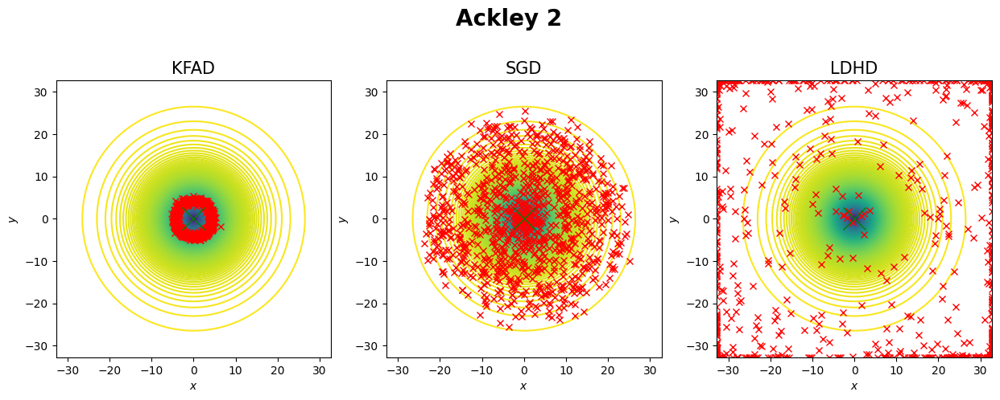

In [37]:
# figures/2d_prob_plots/ackley2_sigma0.5_lr0.01_gamma0.2.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/sigma0.5/lr0.01_gamma0.2_sigma0.5"

fig = plt.figure(figsize=(15, 5))

experiment = "ackley2"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/ackley2.png", bbox_inches='tight')
plt.show()

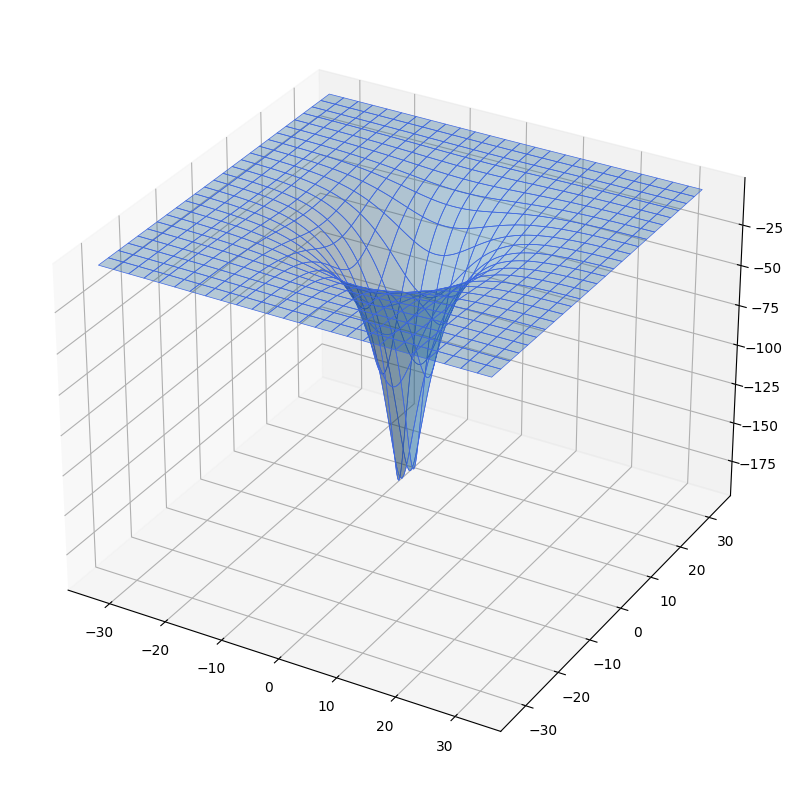

In [51]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/ackley2_surface.png", bbox_inches='tight')
plt.show()

## Levy

levy


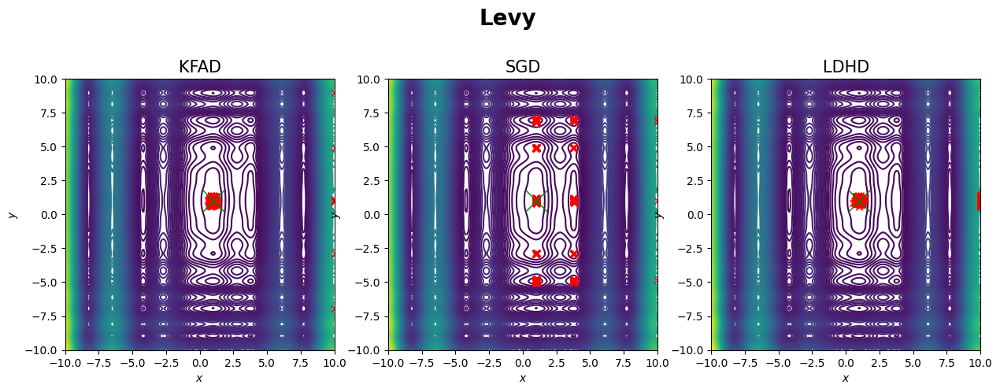

In [52]:
# figures/2d_prob_plots/ackley2_sigma0.5_lr0.01_gamma0.2.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/sigma0.1/lr0.01_gamma0.25_sigma0.1"

fig = plt.figure(figsize=(15, 5))

experiment = "levy"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/levy.png", bbox_inches='tight')
plt.show()

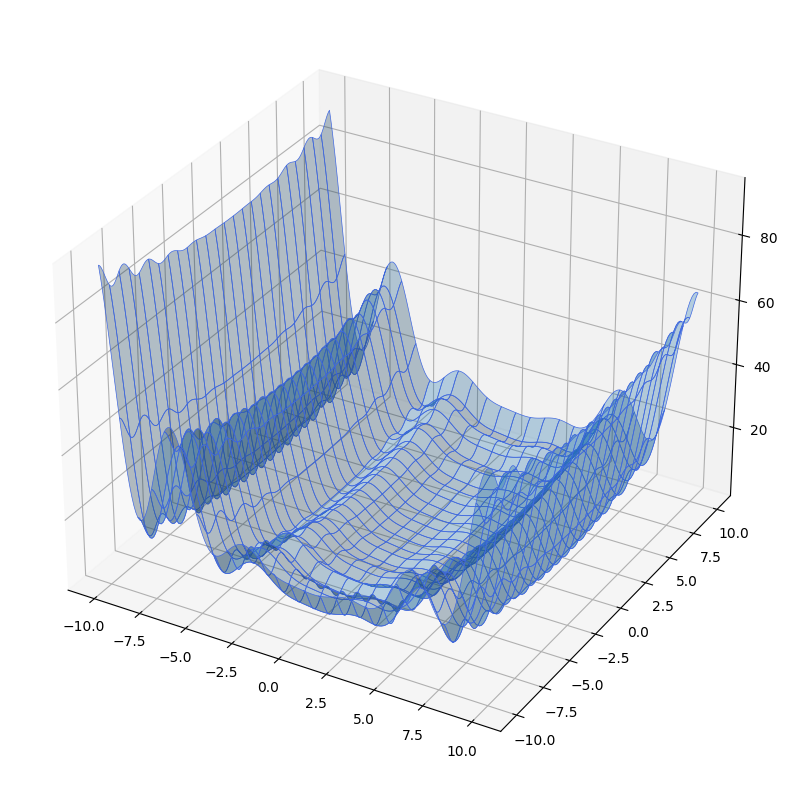

In [53]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/levy_surface.png", bbox_inches='tight')
plt.show()

## Csendes

csendes


/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_33504/197858469.py:33: RuntimeWarning: divide by zero encountered in divide
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))
/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_33504/197858469.py:33: RuntimeWarning: invalid value encountered in sin
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))


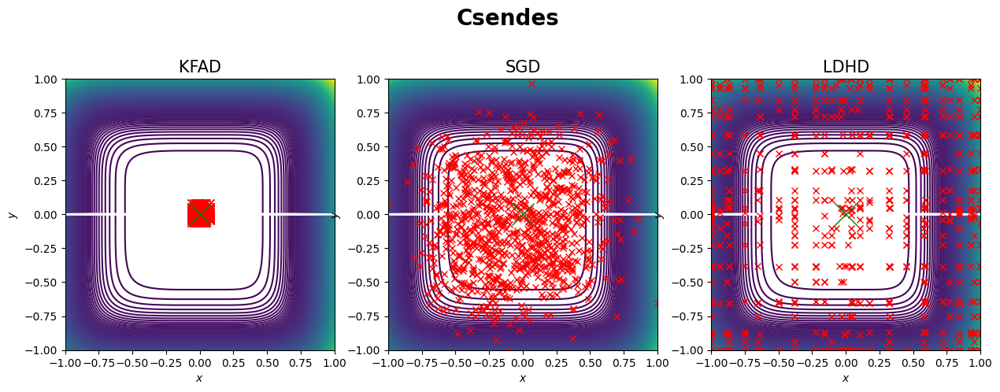

In [55]:
# figures/2d_prob_plots/csendes_nonoise_lr0.1_gamma0.05.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/nonoise_data/lr0.1_gamma0.05_nonoise"

fig = plt.figure(figsize=(15, 5))

experiment = "csendes"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/csendes.png", bbox_inches='tight')
plt.show()

/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_33504/197858469.py:33: RuntimeWarning: divide by zero encountered in divide
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))
/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_33504/197858469.py:33: RuntimeWarning: invalid value encountered in sin
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))


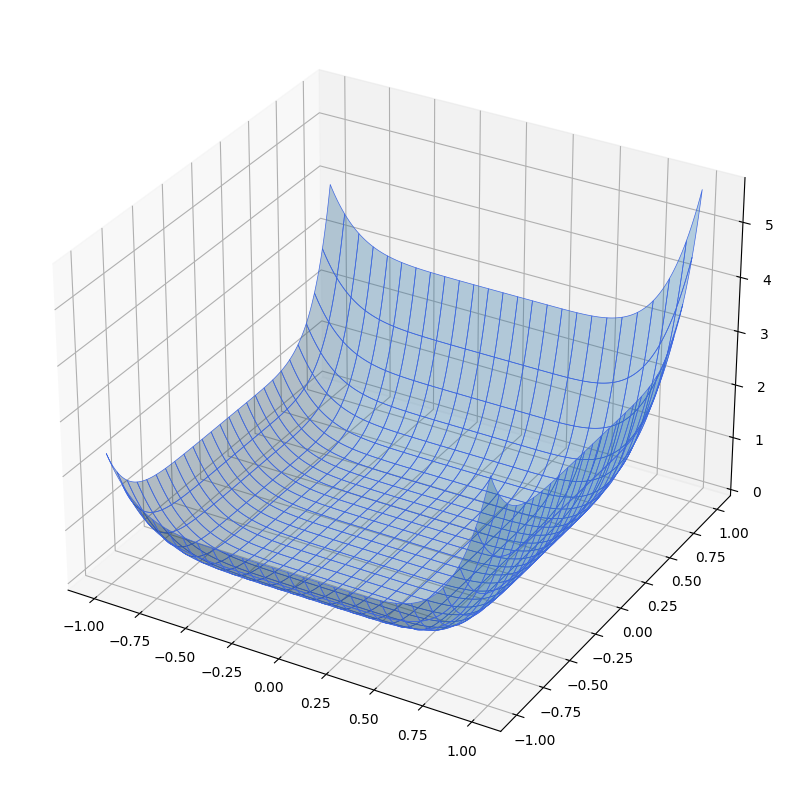

In [57]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
#zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/csendes_surface.png", bbox_inches='tight')
plt.show()

## Michalewicz

michalewicz


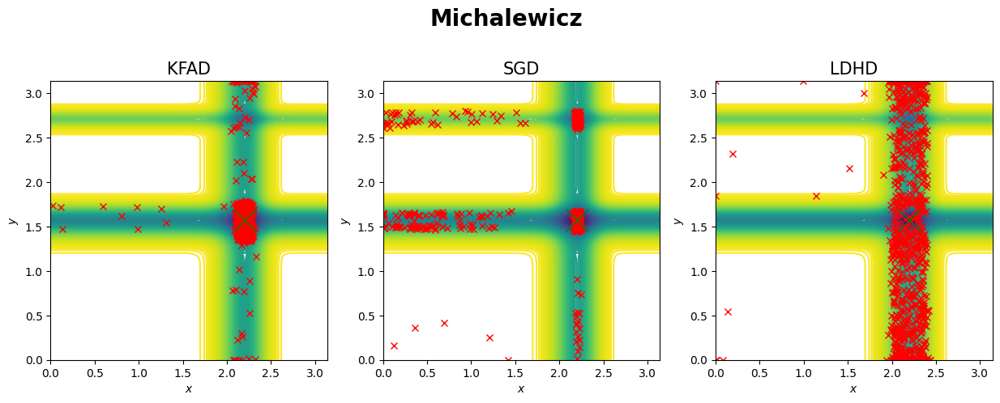

In [58]:
# figures/2d_prob_plots/michalewicz_sigma0.5_lr0.01_gamma0.35.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/sigma0.5/lr0.01_gamma0.35_sigma0.5"

fig = plt.figure(figsize=(15, 5))

experiment = "michalewicz"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/michalewicz.png", bbox_inches='tight')
plt.show()

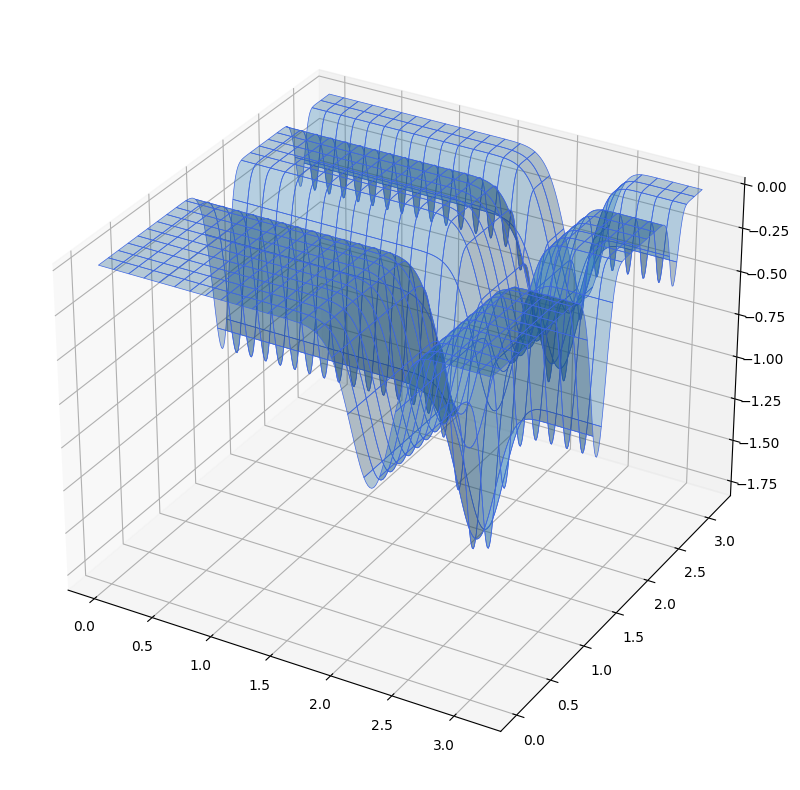

In [59]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
#zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/michalewicz_surface.png", bbox_inches='tight')
plt.show()

## Rastrigin

rastrigin


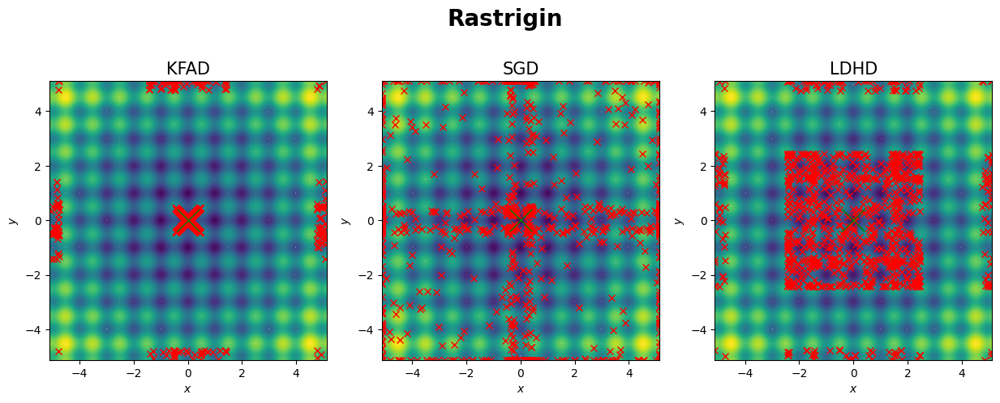

In [64]:
# figures/2d_prob_plots/ackley2_sigma0.5_lr0.01_gamma0.2.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/nonoise_data/lr0.01_gamma5_nonoise"

fig = plt.figure(figsize=(15, 5))

experiment = "rastrigin"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/rastrigin.png", bbox_inches='tight')
plt.show()

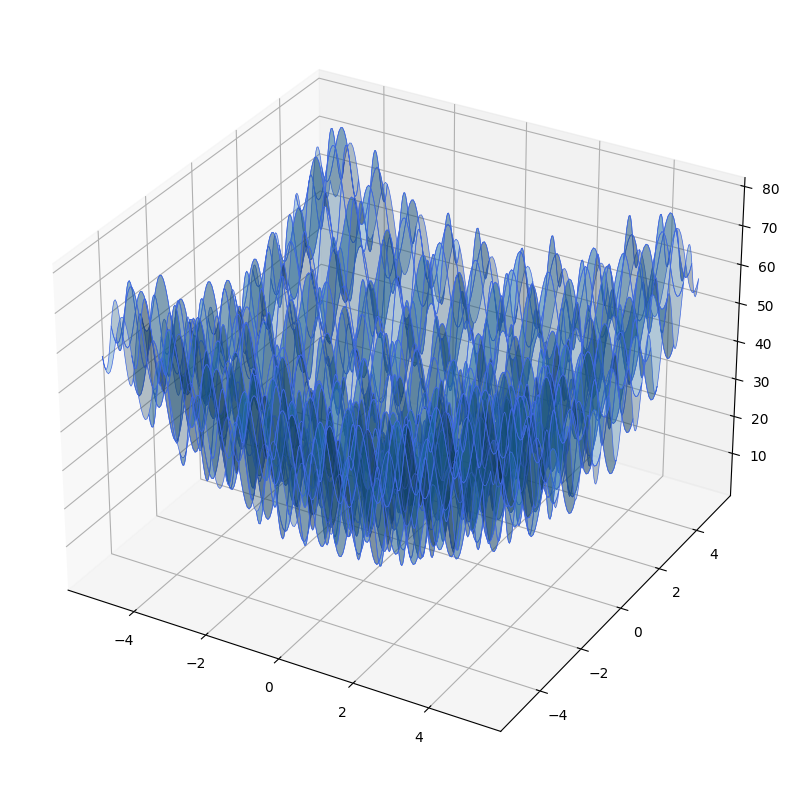

In [65]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
#zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/rastrigin_surface.png", bbox_inches='tight')
plt.show()

## Hosaki

hosaki


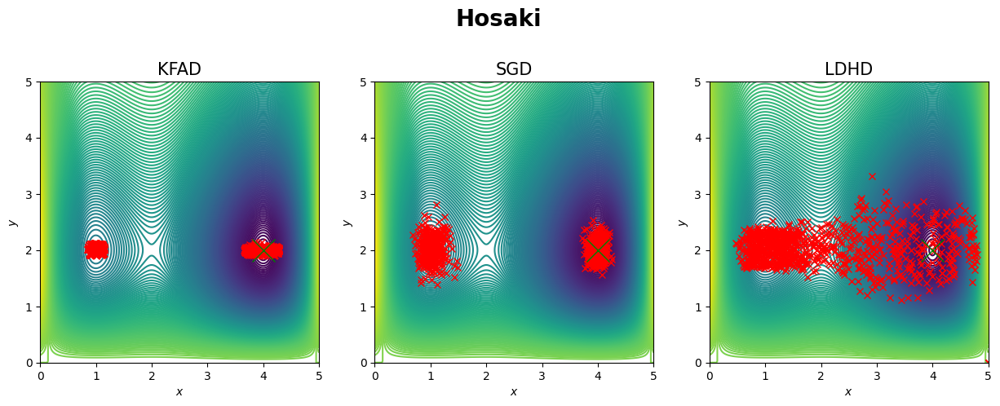

In [60]:
# figures/2d_prob_plots/hosaki_nonoise_lr0.01_gamma0.05.png
DATA_DIR_2D = "/Users/analiacabello/Desktop/Y5/DISS/2D_matlab_experiments/nonoise_data/lr0.01_gamma0.05_nonoise"

fig = plt.figure(figsize=(15, 5))

experiment = "hosaki"
print(experiment)

rows = 1
cols = len(methods)

data = {
       "SGD": {},
       "LDHD": {},
       "KFAD": {}}


scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
    
scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])

fig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]

# create 1x4 subplots per subfig
axs = fig.subplots(nrows=1, ncols=cols)
for j, ax in enumerate(axs):
    method = methods[j]
    method_small = methods_small[j]
    xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
    yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
    ax.contour(xplot,yplot, zplot, levels=200)
    ax.plot(xx,yy, 'x', color='r')
    ax.plot(xmin,ymin, 'x', color='g',ms=20)
    ax.set_xlabel('$x$',fontsize=10)
    ax.set_ylabel('$y$',fontsize=10)
    ax.set_title(method,fontsize=15)
plt.subplots_adjust(top=0.80)
plt.savefig("./figures/hosaki.png", bbox_inches='tight')
plt.show()

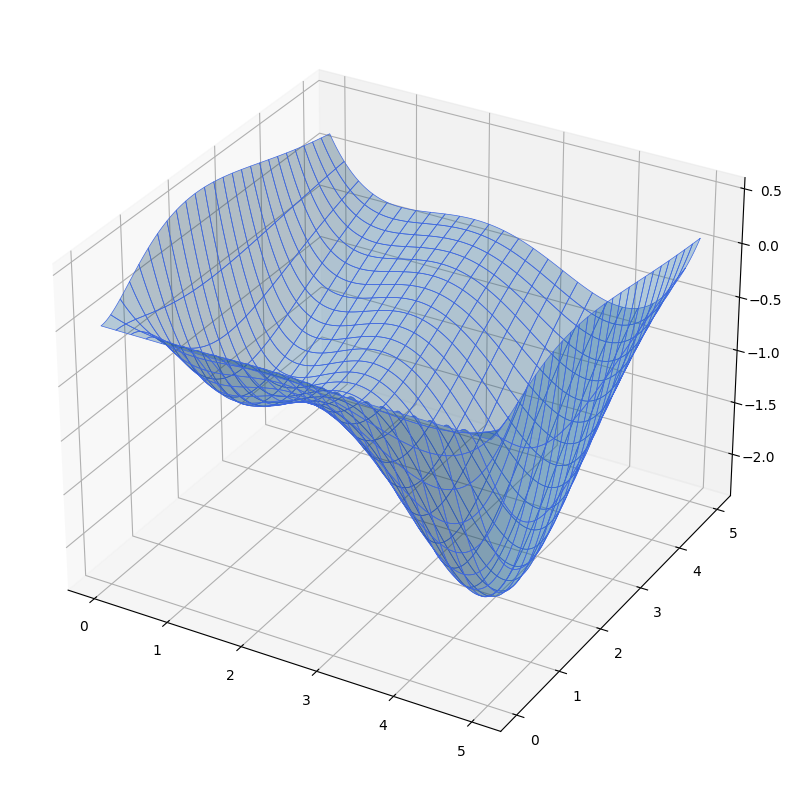

In [61]:
# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
#zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.savefig("./figures/hosaki_surface.png", bbox_inches='tight')
plt.show()

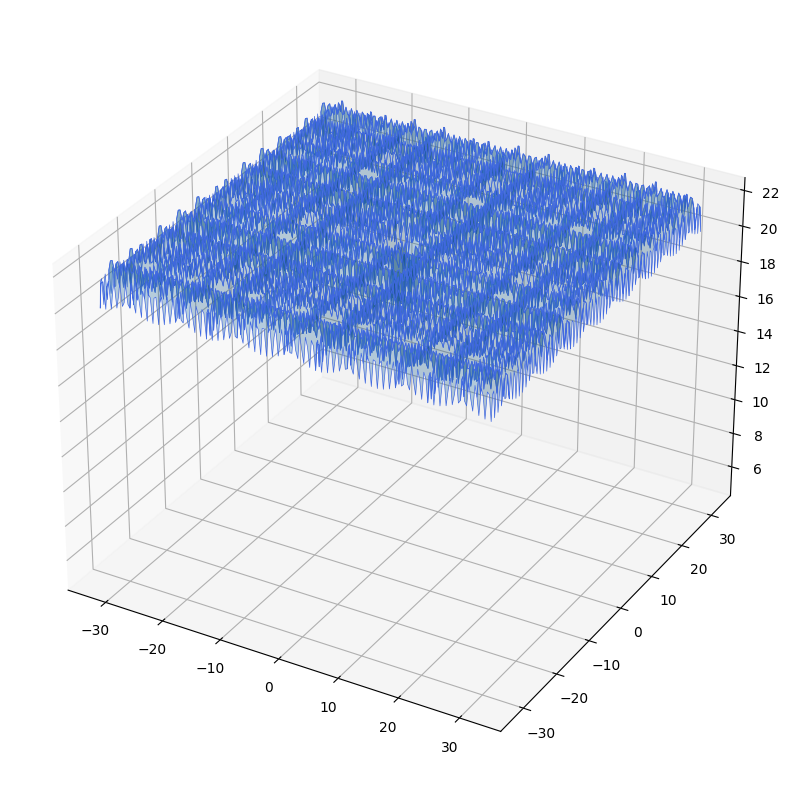

In [68]:
experiment = "ackley"

# 3D plot
xlow, xhigh = fun_bounds[experiment][0]
ylow, yhigh = fun_bounds[experiment][1]
xrange = np.linspace(xlow,xhigh,200) 
yrange = np.linspace(ylow,yhigh,201)
xplot, yplot = np.meshgrid(xrange,yrange)
zplot = funs[experiment]((xplot,yplot)) 
L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
xmin,ymin = global_min_locs[experiment]
xmin = L*xmin +fun_bounds[experiment][0][0]
ymin = L*ymin +fun_bounds[experiment][0][0]
#zmin = funs[experiment]((xmin,ymin))

ax = plt.figure(figsize=(15,10)).add_subplot(projection='3d')
#xrange = np.linspace(-4,4,200) 
#yrange = np.linspace(-5,20,200)
#xplot,yplot = np.meshgrid(xrange,yrange)
#zplot = (a-xplot)**2 + b*(yplot-xplot**2)**2


# plot the 3D surface
ax.plot_surface(xplot, yplot, zplot, edgecolor='royalblue', lw=0.5, rstride=8, cstride=8, alpha=0.3)
#ax.scatter(xmin,ymin,zmin,color='green')
# plot our optimization method
#xx = x_traj[:,0]
#yy = x_traj[:,1]
#zz = []
#for i in range(len(xx)):
    #zz.append((a-xx[i])**2 + b*(yy[i]-xx[i]**2)**2)
#zz = np.array(zz) 
#ax.plot(xx, yy, zz,'-',color='r')
#ax.set(xlim=(-4, 4), ylim=(-5, 20),xlabel='X', ylabel='Y', zlabel='Z')
#ax.set_title('Ackley 2 surface', fontsize=20)
plt.show()

## Ridges and Valleys

dropwave
holder
ackley2
levy13
levy


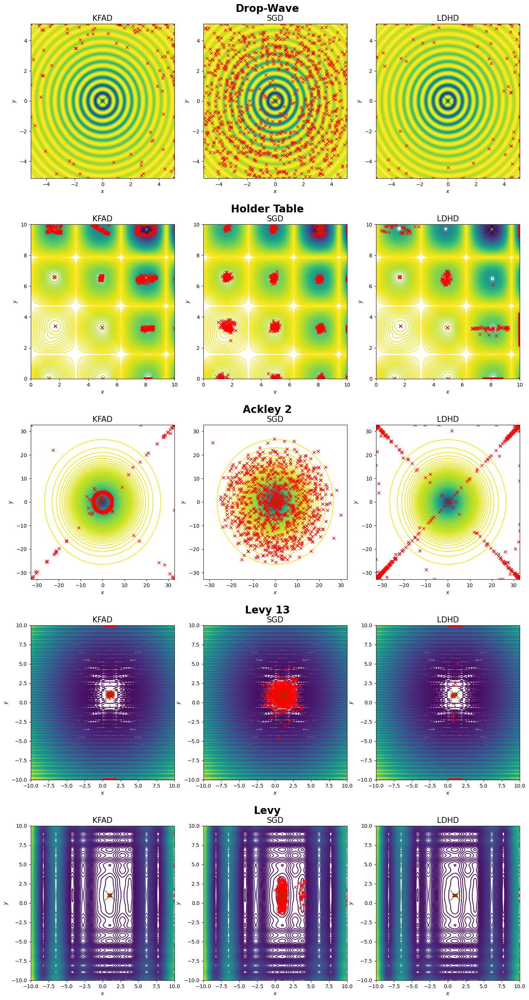

In [10]:
fig = plt.figure(figsize=(17, 27))
fig.suptitle('Ridges and Valleys',fontweight='semibold',fontsize=20)

rows = len(ridgesvalleys)
cols = len(methods)

subfigs = fig.subfigures(nrows=rows, ncols=1)
for i, subfig in enumerate(subfigs):
    experiment = ridgesvalleys[i]
    print(experiment)
    data = {
           "SGD": {},
           "LDHD": {},
           "KFAD": {},
           "NAGD": {},
           "QHD": {}}


    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_NAGD.mat"), mdict=data["NAGD"])
    
    subfig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

    xlow, xhigh = fun_bounds[experiment][0]
    ylow, yhigh = fun_bounds[experiment][1]
    xrange = np.linspace(xlow,xhigh,200) 
    yrange = np.linspace(ylow,yhigh,201)
    xplot, yplot = np.meshgrid(xrange,yrange)
    zplot = funs[experiment]((xplot,yplot)) 
    L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
    xmin,ymin = global_min_locs[experiment]
    xmin = L*xmin +fun_bounds[experiment][0][0]
    ymin = L*ymin +fun_bounds[experiment][0][0]

    # create 1x4 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=cols)
    for j, ax in enumerate(axs):
        method = methods[j]
        method_small = methods_small[j]
        xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
        yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
        ax.contour(xplot,yplot, zplot, levels=200)
        ax.plot(xx,yy, 'x', color='r')
        ax.plot(xmin,ymin, 'x', color='g',ms=20)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_title(method,fontsize=15)

plt.savefig("./figures/RidgesValleys.png", bbox_inches='tight')
plt.show()

defl_corr_spring
rosenbrock
csendes


/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_27229/197858469.py:33: RuntimeWarning: divide by zero encountered in divide
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))
/var/folders/m3/0_m5h87n0zx28dgnznl5g4dh0000gn/T/ipykernel_27229/197858469.py:33: RuntimeWarning: invalid value encountered in sin
  return x1**6 * (2 + np.sin(1 / x1)) + x2**6 * (2 + np.sin(1 / x2))


camel3
bohachevsky2


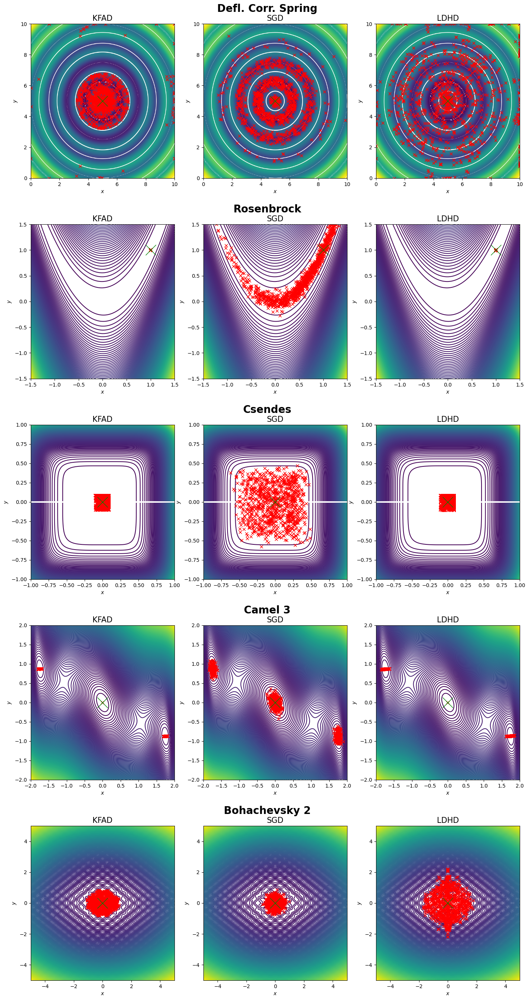

In [11]:
fig = plt.figure(figsize=(17, 27))
fig.suptitle('Basins',fontweight='semibold',fontsize=20)

rows = len(basins)
cols = len(methods)

subfigs = fig.subfigures(nrows=rows, ncols=1)
for i, subfig in enumerate(subfigs):
    experiment = basins[i]
    print(experiment)
    data = {
           "SGD": {},
           "LDHD": {},
           "KFAD": {},
           "NAGD": {},
           "QHD": {}}


    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_NAGD.mat"), mdict=data["NAGD"])
    
    subfig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

    xlow, xhigh = fun_bounds[experiment][0]
    ylow, yhigh = fun_bounds[experiment][1]
    xrange = np.linspace(xlow,xhigh,200) 
    yrange = np.linspace(ylow,yhigh,201)
    xplot, yplot = np.meshgrid(xrange,yrange)
    zplot = funs[experiment]((xplot,yplot)) 
    L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
    xmin,ymin = global_min_locs[experiment]
    xmin = L*xmin +fun_bounds[experiment][0][0]
    ymin = L*ymin +fun_bounds[experiment][0][0]

    # create 1x4 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=cols)
    for j, ax in enumerate(axs):
        method = methods[j]
        method_small = methods_small[j]
        xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
        yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
        ax.contour(xplot,yplot, zplot, levels=200)
        ax.plot(xx,yy, 'x', color='r')
        ax.plot(xmin,ymin, 'x', color='g',ms=20)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_title(method,fontsize=15)

plt.savefig("./figures/Basins.png", bbox_inches='tight')
plt.show()

xinsheyang3
easom
michalewicz


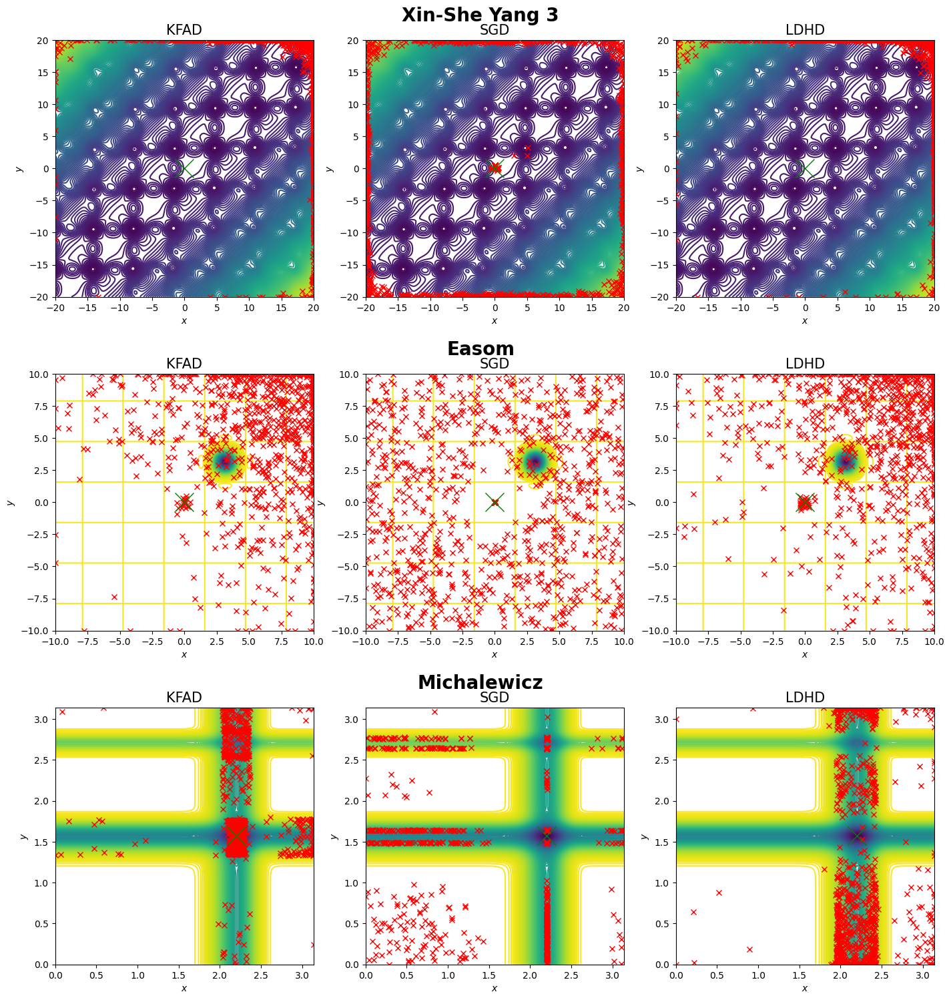

In [27]:
fig = plt.figure(figsize=(17, 15))
fig.suptitle('Flat',fontweight='semibold',fontsize=20)

rows = len(flat)
cols = len(methods)

subfigs = fig.subfigures(nrows=rows, ncols=1)
for i, subfig in enumerate(subfigs):
    experiment = flat[i]
    print(experiment)
    data = {
           "SGD": {},
           "LDHD": {},
           "KFAD": {},
           #"NAGD": {},
           #"QHD": {}
    }


    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])
        
    #scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_NAGD.mat"), mdict=data["NAGD"])
    
    subfig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

    xlow, xhigh = fun_bounds[experiment][0]
    ylow, yhigh = fun_bounds[experiment][1]
    xrange = np.linspace(xlow,xhigh,200) 
    yrange = np.linspace(ylow,yhigh,201)
    xplot, yplot = np.meshgrid(xrange,yrange)
    zplot = funs[experiment]((xplot,yplot)) 
    L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
    xmin,ymin = global_min_locs[experiment]
    xmin = L*xmin +fun_bounds[experiment][0][0]
    ymin = L*ymin +fun_bounds[experiment][0][0]

    # create 1x4 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=cols)
    for j, ax in enumerate(axs):
        method = methods[j]
        method_small = methods_small[j]
        xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
        yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
        ax.contour(xplot,yplot, zplot, levels=200)
        ax.plot(xx,yy, 'x', color='r')
        ax.plot(xmin,ymin, 'x', color='g',ms=20)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_title(method,fontsize=15)

plt.savefig("./figures/Flat_noise.png", bbox_inches='tight')
plt.show()

griewank
alpine1
ackley
rastrigin


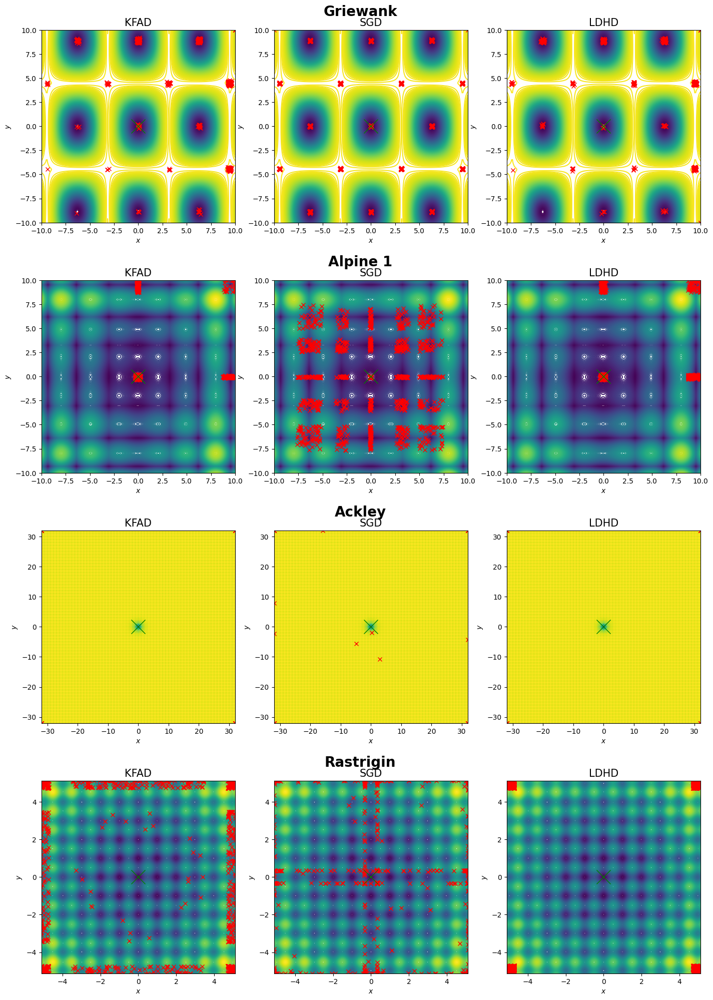

In [28]:
fig = plt.figure(figsize=(17, 20))
fig.suptitle('Studded',fontweight='semibold',fontsize=20)

rows = len(studded)
cols = len(methods)

subfigs = fig.subfigures(nrows=rows, ncols=1)
for i, subfig in enumerate(subfigs):
    experiment = studded[i]
    print(experiment)
    data = {
           "SGD": {},
           "LDHD": {},
           "KFAD": {},
           #"NAGD": {},
           #"QHD": {}
    }


    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])
        
    #scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_NAGD.mat"), mdict=data["NAGD"])
    subfig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

    xlow, xhigh = fun_bounds[experiment][0]
    ylow, yhigh = fun_bounds[experiment][1]
    xrange = np.linspace(xlow,xhigh,200) 
    yrange = np.linspace(ylow,yhigh,201)
    xplot, yplot = np.meshgrid(xrange,yrange)
    zplot = funs[experiment]((xplot,yplot)) 
    L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
    xmin,ymin = global_min_locs[experiment]
    xmin = L*xmin +fun_bounds[experiment][0][0]
    ymin = L*ymin +fun_bounds[experiment][0][0]

    # create 1x4 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=cols)
    for j, ax in enumerate(axs):
        method = methods[j]
        method_small = methods_small[j]
        xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
        yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
        ax.contour(xplot,yplot, zplot, levels=200)
        ax.plot(xx,yy, 'x', color='r')
        ax.plot(xmin,ymin, 'x', color='g',ms=20)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_title(method,fontsize=15)

plt.savefig("./figures/Studded_noise.png", bbox_inches='tight')
plt.show()

styblinski_tang
alpine2
shubert
hosaki
sumofsquares


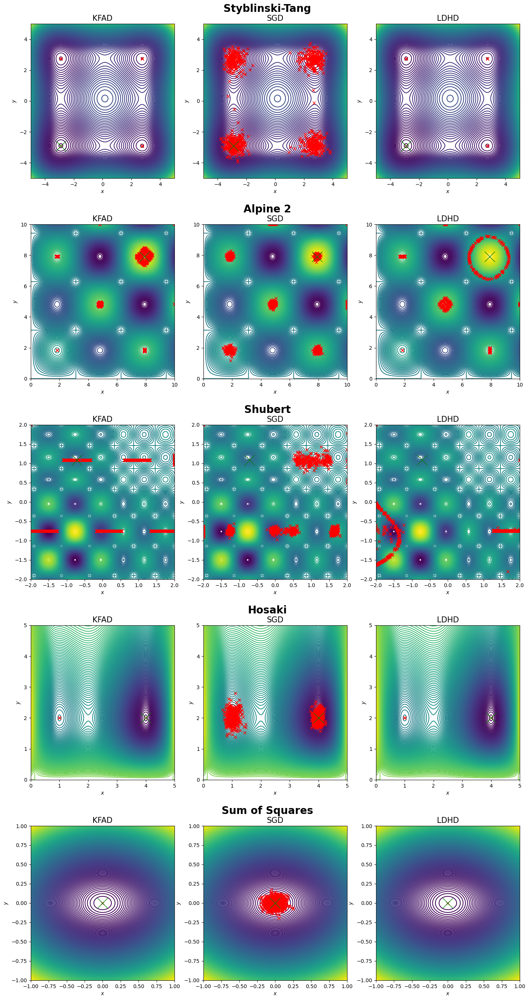

In [14]:
fig = plt.figure(figsize=(17, 27))
fig.suptitle('Simple',fontweight='semibold',fontsize=20)

rows = len(simple)
cols = len(methods)

subfigs = fig.subfigures(nrows=rows, ncols=1)
for i, subfig in enumerate(subfigs):
    experiment = simple[i]
    print(experiment)
    data = {
           "SGD": {},
           "LDHD": {},
           "KFAD": {},
           "NAGD": {},
           "QHD": {}}


    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_SGD.mat"), mdict=data["SGD"])

    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_LDHD.mat"), mdict=data["LDHD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_KFAD.mat"), mdict=data["KFAD"])
        
    scipy.io.loadmat(join(DATA_DIR_2D, experiment, f"{experiment}_NAGD.mat"), mdict=data["NAGD"])
    subfig.suptitle(fname_to_label[experiment],fontweight='semibold',fontsize=20)

    xlow, xhigh = fun_bounds[experiment][0]
    ylow, yhigh = fun_bounds[experiment][1]
    xrange = np.linspace(xlow,xhigh,200) 
    yrange = np.linspace(ylow,yhigh,201)
    xplot, yplot = np.meshgrid(xrange,yrange)
    zplot = funs[experiment]((xplot,yplot)) 
    L = fun_bounds[experiment][0][1]-fun_bounds[experiment][0][0]
    xmin,ymin = global_min_locs[experiment]
    xmin = L*xmin +fun_bounds[experiment][0][0]
    ymin = L*ymin +fun_bounds[experiment][0][0]

    # create 1x4 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=cols)
    for j, ax in enumerate(axs):
        method = methods[j]
        method_small = methods_small[j]
        xx = L*data[method][f"{method_small}_positions"][:,-1,0]+fun_bounds[experiment][0][0]
        yy = L*data[method][f"{method_small}_positions"][:,-1,1]+fun_bounds[experiment][0][0]
        ax.contour(xplot,yplot, zplot, levels=200)
        ax.plot(xx,yy, 'x', color='r')
        ax.plot(xmin,ymin, 'x', color='g',ms=20)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_title(method,fontsize=15)

plt.savefig("./figures/Simple.png", bbox_inches='tight')
plt.show()